In [38]:
import pandas as pd

# Read the data
df = pd.read_csv('data/hours/12H.txt', header=None, names=['taxi ID', 'date time', 'longitude', 'latitude'])
df.head()

,taxi ID,date time,longitude,latitude
0,1,2008-02-03 12:00:29,116.45551,39.88319
1,2,2008-02-03 12:00:53,116.46603,39.84263
2,2,2008-02-03 12:02:39,116.45762,39.84091
3,2,2008-02-03 12:05:54,116.46164,39.83995
4,2,2008-02-03 12:07:41,116.45883,39.84971


In [39]:
# remove duplicates rows from df
df = df.drop_duplicates()
df.head()

,taxi ID,date time,longitude,latitude
0,1,2008-02-03 12:00:29,116.45551,39.88319
1,2,2008-02-03 12:00:53,116.46603,39.84263
2,2,2008-02-03 12:02:39,116.45762,39.84091
3,2,2008-02-03 12:05:54,116.46164,39.83995
4,2,2008-02-03 12:07:41,116.45883,39.84971


In [40]:
# limit the data to the area of interest
print(df.loc[(df['latitude'] == 0) & (df['longitude'] == 0)])
df = df[(df['longitude'] > 115.875363) & (df['longitude'] < 117.351154) & (df['latitude'] > 39.482463) & (df['latitude'] < 40.315493)]
df.loc[(df['latitude'] == 0) & (df['longitude'] == 0)]

        taxi ID            date time  longitude  latitude
21040       291  2008-02-03 12:02:41        0.0       0.0
21041       291  2008-02-03 12:02:43        0.0       0.0
21051       291  2008-02-04 12:02:25        0.0       0.0
21052       291  2008-02-04 12:02:45        0.0       0.0
21064       291  2008-02-05 12:02:57        0.0       0.0
...         ...                  ...        ...       ...
857767     9757  2008-02-08 12:36:19        0.0       0.0
857768     9757  2008-02-08 12:41:02        0.0       0.0
857769     9757  2008-02-08 12:46:01        0.0       0.0
857770     9757  2008-02-08 12:51:03        0.0       0.0
857771     9757  2008-02-08 12:56:01        0.0       0.0

[1229 rows x 4 columns]


,taxi ID,date time,longitude,latitude


In [41]:
# show statistics of the data
df.describe()

,taxi ID,longitude,latitude
count,800571.000000,800571.000000,800571.000000
mean,5214.437345,116.423599,39.930673
std,2964.227093,0.175364,0.099901
min,1.000000,115.875430,39.482470
25%,2669.000000,116.338780,39.883720
50%,5160.000000,116.405820,39.921180
75%,7879.000000,116.463500,39.970730
max,10357.000000,117.351140,40.315480


In [42]:
test = pd.to_datetime(df.iloc[2]['date time']) - pd.to_datetime(df.iloc[1]['date time'])
test.total_seconds()

106.0

In [43]:
# import radians function from math package
from math import radians, cos, sin, asin, sqrt, atan2

# get distance from latitude and longitude
def get_distance(lat1, lon1, lat2, lon2):
    R = 6373.0

    lat1 = radians(lat1)
    lon1 = radians(lon1)
    lat2 = radians(lat2)
    lon2 = radians(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance*1000

df['distance'] = 0
df['time'] = 0
df['speed'] = 0
for i in range(1, len(df)):
    if(df.iloc[i]['taxi ID'] == df.iloc[i-1]['taxi ID']):
        df.iloc[i, df.columns.get_loc('distance')] = get_distance(df.iloc[i]['latitude'], df.iloc[i]['longitude'], df.iloc[i-1]['latitude'], df.iloc[i-1]['longitude'])
        df.iloc[i, df.columns.get_loc('time')] = (pd.to_datetime(df.iloc[i]['date time']) - pd.to_datetime(df.iloc[i-1]['date time'])).total_seconds()
        if df.iloc[i]['time'] > 0:
            df.iloc[i, df.columns.get_loc('speed')] = df.iloc[i]['distance'] / df.iloc[i]['time']

df.head()

,taxi ID,date time,longitude,latitude,distance,time,speed
0,1,2008-02-03 12:00:29,116.45551,39.88319,0.000000,0,0.000000
1,2,2008-02-03 12:00:53,116.46603,39.84263,0.000000,0,0.000000
2,2,2008-02-03 12:02:39,116.45762,39.84091,743.291776,106,7.012187
3,2,2008-02-03 12:05:54,116.46164,39.83995,359.553138,195,1.843862
4,2,2008-02-03 12:07:41,116.45883,39.84971,1111.810321,107,10.390751


In [44]:
print(max(df['speed']))

81921.58920942526


In [45]:
# print df in a txt file
df.to_csv('data/hours/12Hcomplete.txt', index=False, header=False)

In [46]:
# apply k-means clustering
from sklearn.cluster import KMeans

# get the data
X = df[['distance', 'longitude', 'latitude', 'speed', 'time']].values
# apply k-means clustering
kmeans = KMeans(n_clusters=3, random_state=0).fit(X)

# get the labels
labels = kmeans.labels_

# # add the labels to the data
df2 = df.copy()
df2['label'] = labels

# # count the different values of the labels
df2['label'].value_counts()

0    762801
1     34607
2      3163
Name: label, dtype: int64

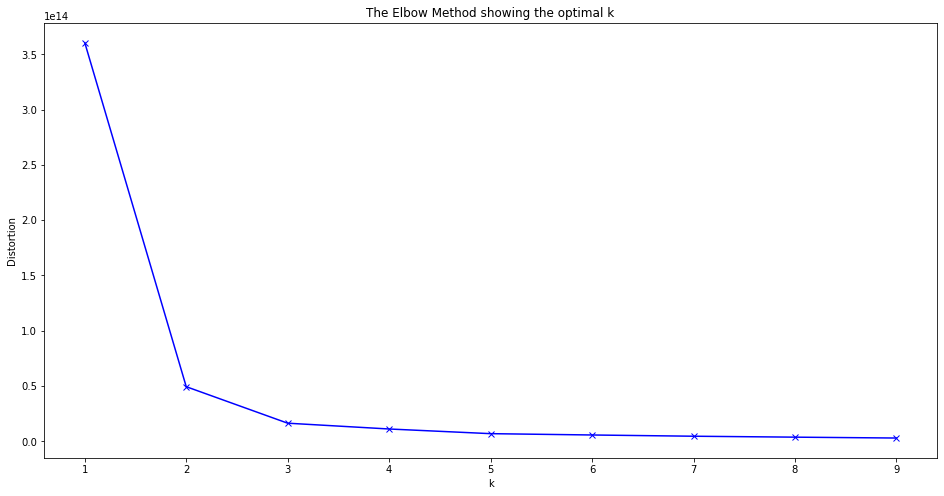

In [47]:
import matplotlib.pyplot as plt
%matplotlib inline

distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(df[['distance', 'longitude', 'latitude', 'speed', 'time']])
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [48]:
df2.groupby('label')['distance'].mean()

label
0      783.182370
1    12384.273740
2    17505.003075
Name: distance, dtype: float64

In [49]:
# compute the average speed by label
df2.groupby('label')['speed'].mean()

label
0    12.794751
1     0.148356
2     0.094298
Name: speed, dtype: float64

In [50]:
# folium
import folium

# dictionary for colors
colors = {0:'white', 1:'red', 2:'yellow', 3:'orange', 4:'green'}

# create a map
m = folium.Map(location=[df2['latitude'].mean(), df2['longitude'].mean()], zoom_start=12)

# plot the location points with color indicating the label
for i in range(0, 300000):
    if(df2.iloc[i]['label'] != 0):
        folium.CircleMarker([df2.iloc[i]['latitude'], df2.iloc[i]['longitude']],
                            radius=1,
                            color=colors[df2.iloc[i]['label']],
                            fill=True,
                            fill_color=colors[df2.iloc[i]['label']],
                            fill_opacity=0.7).add_to(m)

# show the map
m